In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

## NEED TO SET UP meas_modelfit *before starting ipython* for code at bottom (not included in lsst_apps!)

In [142]:
import diffimTests as dit
reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(5000, 10), 
                         #varFlux2=np.repeat(620*np.sqrt(2), 20),
                         n_sources=600, verbose=True, 
                         sourceFluxRange=(2000., 250000.), saturation=250000., 
                         bad_columns=[255, 256, 257],
                         variablesAvoidBorder=3.5, psf_yvary_factor=0., psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
('HERE:', 249033.75975307313, 2000.0)
PSF y spatial-variation: 0.0 0.0
Variable source: 7 452.792255871 412.392281342 0 5000
Variable source: 2 53.7477835412 275.217856552 0 5000
Variable source: 13 453.005019091 297.958858942 0 5000
Variable source: 3 57.4818942906 245.143166623 0 5000
Variable source: 10 73.1909119093 212.227864876 0 5000
Variable source: 14 413.461575292 303.002852121 0 5000
Variable source: 4 107.303982136 258.332221768 0 5000
Variable source: 6 120.376361872 219.968576225 0 5000
Variable source: 9 129.56746846 196.881104362 0 5000
Variable source: 15 391.602266694 234.690863744 0 5000
0 saturated pixels (template)
0 saturated pixels (science)
{'Zogy': {'FP': 1, 'FN': 0, 'TP': 10}, 'ALstack': {'FP': 1, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 1, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 1, 'FN': 0, 'TP': 10}}


Add saturation, bleeding, bad pixels, etc. and see what it does!

In [143]:
print testObj.im1.im.max(), testObj.im2.im.max()

250000.0 250000.0


A&L(dec): stats(mean=-0.039318986, stdev=24.924982, min=-219431.02, max=291715.75)
Zogy: stats(mean=-0.13530114, stdev=24.814226, min=-220924.95, max=293956.44)
A&L(dec) - Zogy: stats(mean=0.00286984, stdev=1.994316, min=-13593.812, max=17769.422)
A&L(dec) - A&L: stats(mean=-0.052566852, stdev=6.882967, min=-42879.105, max=41230.75)
Scorr: stats(mean=6.3057001e-07, stdev=0.00025581944, min=-8.7905359, max=9.8534756)
Scorr_var: stats(mean=0.00025196283, stdev=1.440974e-06, min=0.00024681751, max=0.049887881)


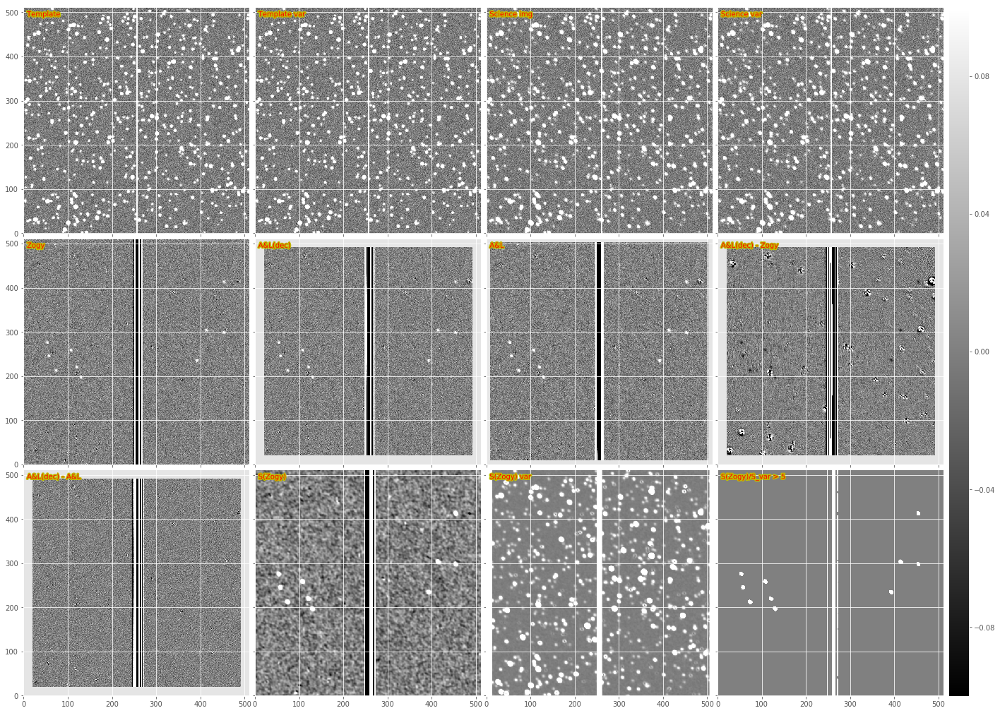

In [144]:
#dit.plotImageGrid((testObj.im1.im, testObj.im2.im), imScale=8)
testObj.doPlot(imScale=6, include_Szogy=True);

In [61]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.afw.math as afwMath
import lsst.meas.algorithms as measAlg
import lsst.pipe.base as pipeBase
import lsst.ip.diffim as ipDiffim

In [145]:
config = dit.DecorrelateALKernelMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [146]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()

In [147]:
exposure2 = testObj.im2.asAfwExposure()
obj = dit.tasks.PsfMeasurement(exposure2)
obj.run()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
obj = dit.tasks.PsfMeasurement(template2)
obj.run()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

501
515


In [148]:
ALres = dit.tasks.doAlInStack(template2, exposure2, doWarping=False, doDecorr=True, doPreConv=False,
            spatialBackgroundOrder=0, spatialKernelOrder=2)

In [149]:
newExpC = task.run(ALres.subtractedExposure, template=template2, science=exposure2,
                  alTaskResult=ALres, forceEvenSized=True).exposure

Grid parameters: 47 47 42.685546875 42.685546875 14 14


In [150]:
testObj2 = testObj.clone()
testObj2.ALres.decorrelatedDiffim = newExpC
testObj2.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 1, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 1, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 1, 'TP': 10}}

Finally, let's compare it to spatially-varying ZOGY!

NOTE that the `gridStep/gridSize` combo doesn't seem to correctly fully cover the entire image in all cases! In this case (the default), it does, but if I uncomment the 'gridStep' setting line below, it doesn't.

In [151]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 10
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 4
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 4.0, 'borderSizeY': 4.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


Grid parameters: 47 47 42.685546875 42.685546875 19 19


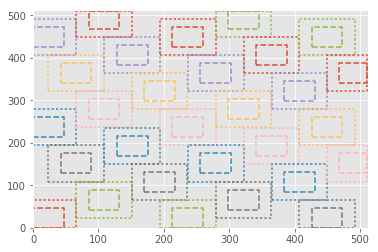

In [152]:
task._generateGrid(exposure2, forceEvenSized=True)
task.plotBoxes(exposure2.getBBox(), skip=5)

In [153]:
newExpZ = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExpZ_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure

{'Zogy': {'FP': 1, 'FN': 0, 'TP': 10}, 'ALstack': {'FP': 1, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 1, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 1, 'FN': 0, 'TP': 10}}
A&L(dec): stats(mean=0.059785429, stdev=24.88937, min=-219321.78, max=291566.31)
Zogy: stats(mean=0.06868957, stdev=25.429583, min=-213158.22, max=339694.38)
A&L(dec) - Zogy: stats(mean=0.02675792, stdev=24.132635, min=-70461.969, max=60306.781)
A&L(dec) - A&L: stats(mean=-0.052649047, stdev=6.8719206, min=-43005.449, max=41257.0)
Scorr: stats(mean=-2.3803216e-06, stdev=0.00025871804, min=-8.7192116, max=9.7992039)
Scorr_var: stats(mean=0.00024872259, stdev=1.7852909e-06, min=0.00024227092, max=0.0061841332)


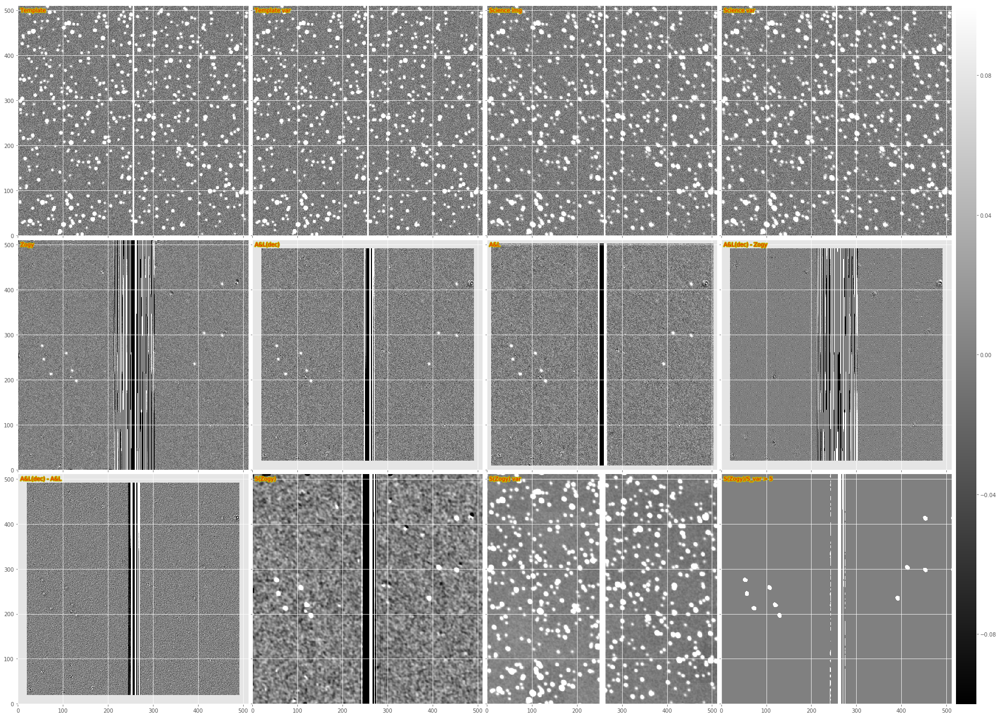

In [154]:
testObj3 = testObj.clone()
testObj3.ALres.decorrelatedDiffim = newExpC
testObj3.D_Zogy = newExpZ
testObj3.S_Zogy = newExpZ_Scorr
print testObj3.runTest(spatialKernelOrder=2)
testObj3.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

Looks like there's worse ringing when the spatial grid is used. Let's see if it gets a bit better when we use larger stamps...

Grid parameters: 141 141 51.447265625 51.447265625 19 19


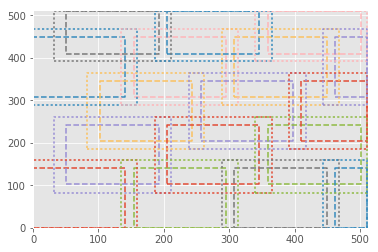

In [155]:
config.gridStepX = config.gridStepY = 15
config.gridSizeX = config.gridSizeY = 30
task = dit.ImageMapReduceTask(config=config)
task._generateGrid(exposure2, forceEvenSized=True)
task.plotBoxes(exposure2.getBBox(), skip=6)

In [156]:
newExpZ = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExpZ_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure

{'Zogy': {'FP': 4, 'FN': 3, 'TP': 7}, 'ALstack': {'FP': 1, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 1, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 1, 'FN': 0, 'TP': 10}}
A&L(dec): stats(mean=0.059785429, stdev=24.88937, min=-219321.78, max=291566.31)
Zogy: stats(mean=0.0838845, stdev=29.659857, min=-209588.16, max=339091.25)
A&L(dec) - Zogy: stats(mean=0.059724703, stdev=29.23909, min=-66502.508, max=56131.633)
A&L(dec) - A&L: stats(mean=-0.052649047, stdev=6.8719206, min=-43005.449, max=41257.0)
Scorr: stats(mean=-2.89594e-06, stdev=0.00025688889, min=-8.7092056, max=9.786437)
Scorr_var: stats(mean=0.00024873752, stdev=1.6706892e-06, min=0.00024296677, max=0.0061780717)


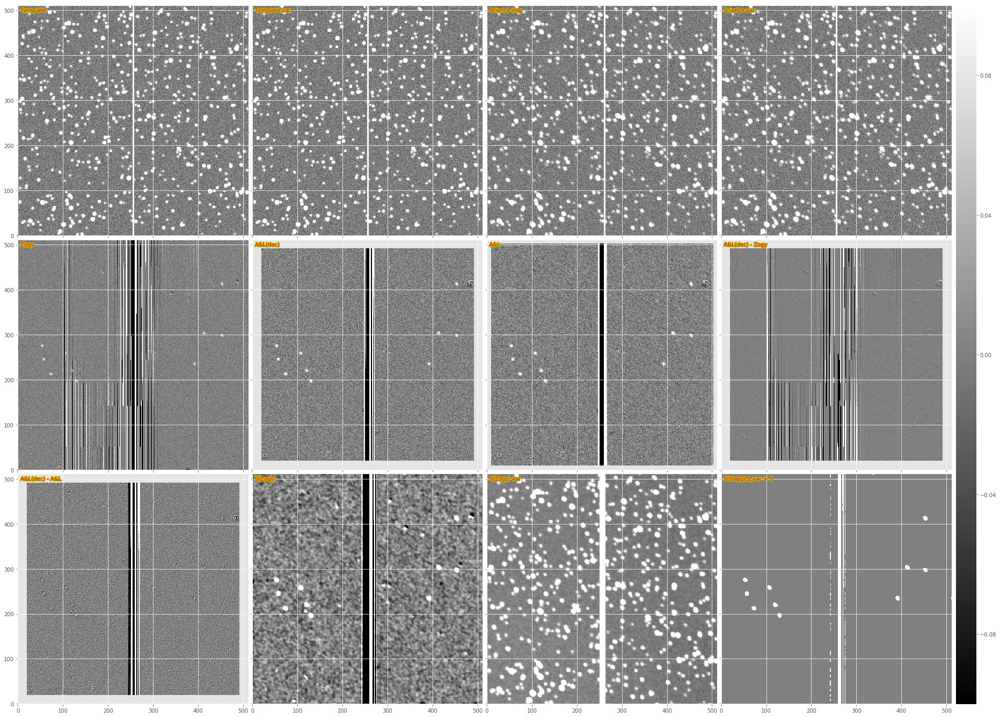

In [157]:
testObj3 = testObj.clone()
testObj3.ALres.decorrelatedDiffim = newExpC
testObj3.D_Zogy = newExpZ
testObj3.S_Zogy = newExpZ_Scorr
print testObj3.runTest(spatialKernelOrder=2)
testObj3.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

See if using `inImageSpace = True` helps...

Need to increase the border size

Definitely takes a while!

{'gridStepY': 15.0, 'gridStepX': 15.0, 'mapperSubtask': {}, 'gridSizeX': 30.0, 'gridSizeY': 30.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 4.0, 'borderSizeY': 4.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}
Grid parameters: 141 141 51.447265625 51.447265625 19 19


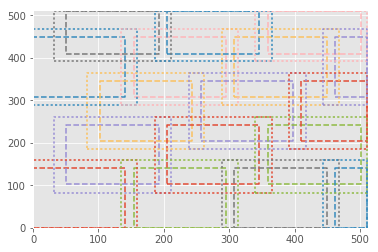

In [159]:
# config = dit.ZogyMapReduceConfig()
# config.gridStepX = config.gridStepY = 4
# #config.gridSizeX = config.gridSizeY = 15
# config.borderSizeX = config.borderSizeY = 6
# config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

task._generateGrid(exposure2, forceEvenSized=True)
task.plotBoxes(exposure2.getBBox(), skip=6)

In [160]:
newExpZIS = task.run(exposure2, template=template2, inImageSpace=True, # padSize=50,
                       Scorr=False, forceEvenSized=True).exposure
#newExpZIS_Scorr = task.run(exposure2, template=template2, inImageSpace=True,
#                       Scorr=True, forceEvenSized=True).exposure

In [161]:
testObj3IS = testObj.clone()
testObj3IS.ALres.decorrelatedDiffim = newExpC
testObj3IS.D_Zogy = newExpZIS  #dit.Exposure(ga(newExpZ), testObj.D_Zogy.psf, gv(newExpZ))
#testObj3IS.S_Zogy = newExpZIS_Scorr  #dit.Exposure(ga(newExpZ_Scorr), dit.psf.afwPsfToArray(newExpZ_Scorr.getPsf()), gv(newExpZ_Scorr))
testObj3IS.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 1, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 1, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 6, 'TP': 10}}

stats(mean=-0.071091868, stdev=2.1573615, min=-7011.0312, max=8235.0312)


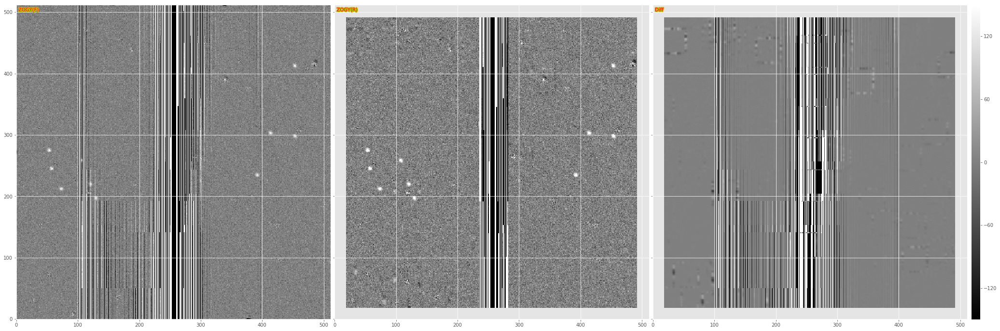

In [162]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS), ga(newExpZ)-ga(newExpZIS)), imScale=12,
                 titles=['ZOGY(F)', 'ZOGY(R)', 'Diff'])

In [91]:
#newExp_Scorr = task.run(exposure, template=template, inImageSpace=True, variablePsf=testObj.variablePsf,
#                       Scorr=True, forceEvenSized=True).exposure
newExp_Ispace = task.run(exposure2, template=template2, inImageSpace=True, padSize=50,
                         variablePsf=testObj.variablePsf,
                         Scorr=False, forceEvenSized=True).exposure
newExp_Fspace = task.run(exposure2, template=template2, inImageSpace=False, 
                         variablePsf=testObj.variablePsf,
                         Scorr=False, forceEvenSized=True).exposure

stats(mean=-0.041776784, stdev=25.051641, min=-213086.94, max=340941.81)
stats(mean=0.06876348, stdev=25.428583, min=-213158.3, max=339718.25)
stats(mean=0.011576507, stdev=1.7462981, min=-8382.25, max=11506.797)


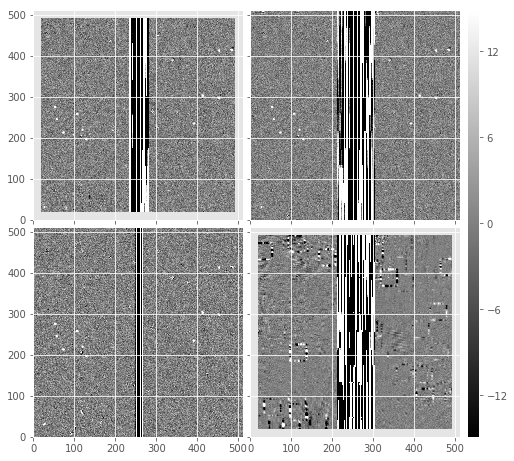

In [92]:
#Sim = ga(newExp_Scorr)
#Svar = newExp_Scorr.getMaskedImage().getVariance().getArray()
#print dit.computeClippedImageStats(Sim-testObj.S_Zogy.im)
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)